In [1]:
import numpy as np
import xarray as xr
import cartopy
import hvplot.xarray
import panel as pn
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
import geoviews.feature as gf

pn.extension(loading_spinner='dots', loading_color='black')
pn.param.ParamMethod.loading_indicator = True

mpl.rcParams['font.sans-serif'] = "Arial"

cm_data = np.loadtxt("./utils/bamako.txt")[::-1]
bamako_map = LinearSegmentedColormap.from_list("bamako", cm_data, N=10)

In [2]:
#############
## Sidebar
#############

In [23]:
text = """
### Downscaling and bias-correction contribute considerable uncertainty to local climate projections in CMIP6

*David C. Lafferty & Ryan L. Sriver*

*Unversity of Illinois Urbana-Champaign*

This application allows you to explore which sources of uncertainty are most important for projections of climate change at different locations and time horizons.

There are 3 interactive graphics to choose from:

1. Map plots
2. Timeseries plots
3. Boxplots

*Note:* when entering coordinates to look at a specific location or region, latitudes must lie between -60 and 90, and longitudes between -180 and 180. Locations over the ocean are also not included in our analysis so they will return NaN values.
"""

sidebar = pn.layout.WidgetBox(
    pn.pane.Markdown(text, margin=(0, 10)),
    max_width=350,
    sizing_mode='stretch_width',
    styles={'background': '#E5E4E2'}
).servable(area='sidebar')

In [25]:
############
# Boxplot
############

In [5]:
city_select = pn.widgets.AutocompleteInput(
    name='City', options=['Chicago', 'New Delhi', 'Lagos', 'Seattle'],
    placeholder='Select a city',
    case_sensitive=False)

In [27]:
# Need to finish this

In [6]:
#######################
# Grid point plot
######################

In [28]:
# Load all metrics
ds_avg_tas = xr.open_dataset('./data/netcdf/avg_tas.nc')
ds_dry_days = xr.open_dataset('./data/netcdf/dry_days.nc')

# Merge
ds_grid = xr.merge([ds_avg_tas, ds_dry_days])

In [8]:
## User input widgets

# Metric
metric_select_gridpoint = pn.widgets.Select(name='', 
                                            value='Annual Average Temperature',
                                            options=['Annual Average Temperature', 'Annual Number of Dry Days'],
                                            height=20)
# Type of location
location_type_select = pn.widgets.RadioButtonGroup(name='Area of Interest',
                                                   options=['Coordinate', 'Region', 'City'],
                                                   value = 'Coordinate')

# Location coordinates
lat_select = pn.widgets.FloatInput(name='Latitude Coordinate',
                                    value=10., step=1, start=-60, end=90, width=150)

lon_select = pn.widgets.FloatInput(name='Longitude Coordinate',
                                    value=0., step=1, start=-180, end=180, width=150)

lat_min_select = pn.widgets.FloatInput(name='Bounding Latitude Coordinates',
                                       value=10., step=1, start=-60, end=90, width=100)
lat_max_select = pn.widgets.FloatInput(name='',
                                       value=11., step=1, start=-60, end=90, width=100,
                                       margin=(23,0,0,0))

lon_min_select = pn.widgets.FloatInput(name='Bounding Longitude Coordinates',
                                       value=-4., step=1, start=-180, end=180, width=100)
lon_max_select = pn.widgets.FloatInput(name='',
                                       value=-5, step=1, start=-180, end=180, width=100,
                                       margin=(23,0,0,0))

# Complete location widget
def location_select_func(location_type):
    if location_type == 'Coordinate':
        return pn.Row(lat_select, lon_select)
    elif location_type == 'Region':
        return pn.Row(lat_min_select, lat_max_select, lon_min_select, lon_max_select)
    elif location_type == 'City':
        return pn.Row(city_select, height=100)
    
interactive_select_area = pn.bind(location_select_func, location_type=location_type_select)  

In [29]:
# Timeseries plotting function
def plot_variance_decomposition(
    metric,
    location_type,
    lon, lat,
    lon_min, lon_max, lat_min, lat_max,
    city
):
    plt.rcParams.update({'font.size': 6})
    
    # Translate user input to metric names
    metric_names = {'Annual Average Temperature':'avg_tas', 'Annual Number of Dry Days':'dry_days'}
    metric_name = metric_names[metric]
    
    # Select metric
    ds_plot = ds_grid[metric_name]
    
    # Select location
    if location_type == 'Coordinate':
        ds_masked = ds_plot.sel(lat=lat, lon=lon, method="nearest")
        lon_out = ds_masked.lon
        lat_out = ds_masked.lat
            
    elif location_type == 'Region':
        lon_min_true = min([lon_min, lon_max])
        lon_max_true = max([lon_min, lon_max])
        lat_min_true = min([lat_min, lat_max])
        lat_max_true = max([lat_min, lat_max])
        
        ds_masked = ds_plot.sel(lat=slice(lat_min_true, lat_max_true), lon=slice(lon_min_true, lon_max_true))
        
        lon_min_out = ds_masked.lon.min()
        lon_max_out = ds_masked.lon.max()
        lat_min_out = ds_masked.lat.min()
        lat_max_out = ds_masked.lat.max()
        
        ds_masked = ds_masked.mean(dim=["lat", "lon"], skipna=True)

    # Construct plotting dict
    uncert_dict = {
        "Scenario": ds_masked.sel(uncertainty="scenario_hs09").to_numpy().flatten(),
        "Model": ds_masked.sel(uncertainty="model").to_numpy().flatten(),
        "Downscaling": ds_masked.sel(uncertainty="ensemble").to_numpy().flatten(),
        "Variability": ds_masked.sel(uncertainty="variability").to_numpy().flatten(),
    }

    # Make plot
    fig = mpl.figure.Figure(figsize=(3, 2))
    ax = fig.subplots()

    ax.stackplot(
        np.arange(2015, 2101),
        uncert_dict.values(),
        labels=uncert_dict.keys(),
        alpha=1,
        colors=["#00CC89", "#6869B3", "#CC883C", "#FFFF99"],
        edgecolor="white",
        lw=0.75,
    )

    # Plot details
    ax.set_xlim([2020, 2095])
    ax.set_xticks([2030, 2050, 2070, 2090])
    ax.set_ylim([0, 100])
    ax.set_ylabel("Fraction of total variance (%)")
    ax.legend(ncol=2, loc="upper left")

    # Title
    if location_type == 'Coordinate':
        ax.set_title("Exact Coordinate: {:.3f}N, {:.3f}E".format(lat_out, lon_out), fontsize=6)
    elif location_type == 'Region':
        ax.set_title(
            "Exact Region: {:.3f}N < lat. < {:.3f}N, {:.3f}E < lon. < {:.3f}E".format(
                lat_min_out, lat_max_out, lon_min_out, lon_max_out
            ), fontsize=6
        )
    
    mpl_pane = pn.pane.Matplotlib(fig, dpi=200)
    return mpl_pane

In [30]:
# Bind plot function to widgets for reactivity
plot_variance_decomposition_interactive = pn.bind(plot_variance_decomposition,
                                                  metric = metric_select_gridpoint,
                                                  location_type = location_type_select,
                                                  lon = lon_select, lat = lat_select,
                                                  lon_min = lon_min_select, lon_max = lon_max_select,
                                                  lat_min = lat_min_select, lat_max = lat_max_select,
                                                  city = city_select)

In [16]:
################
## Map plot
################

In [31]:
## Take temporal averages

# Averaging periods
early_start, early_end = 2020, 2039
mid_start, mid_end = 2050, 2069
late_start, late_end = 2080, 2099

# Average Temperaturea
ds_avg_tas_early = ds_avg_tas.sel(time=slice(early_start, early_end)).mean(dim='time').assign_coords(time="early")
ds_avg_tas_mid = ds_avg_tas.sel(time=slice(mid_start, mid_end)).mean(dim='time').assign_coords(time="mid")
ds_avg_tas_late = ds_avg_tas.sel(time=slice(late_start, late_end)).mean(dim='time').assign_coords(time="late")

ds_avg_tas_sliced = xr.concat([ds_avg_tas_early, ds_avg_tas_mid, ds_avg_tas_late], dim='time')

# Dry Days
ds_dry_days_early = ds_dry_days.sel(time=slice(early_start, early_end)).mean(dim='time').assign_coords(time="early")
ds_dry_days_mid = ds_dry_days.sel(time=slice(mid_start, mid_end)).mean(dim='time').assign_coords(time="mid")
ds_dry_days_late = ds_dry_days.sel(time=slice(late_start, late_end)).mean(dim='time').assign_coords(time="late")

ds_dry_days_sliced = xr.concat([ds_dry_days_early, ds_dry_days_mid, ds_dry_days_late], dim='time')

# Merge
ds_map = xr.merge([ds_avg_tas_sliced, ds_dry_days_sliced])

In [18]:
# Define user input widgets
metric_select_map = pn.widgets.Select(name='Metric', 
                                  value='Annual Average Temperature',
                                  options=['Annual Average Temperature', 'Annual Number of Dry Days'])# 'Annual Total Precipitation', 'Annual Maximum of Daily Maximum Temperature'])

time_select = pn.widgets.Select(name='Time Slice', options=['Early Century (2020-2039)', 'Mid-Century (2050-2069)', 'Late-Century (2080-2099)'])

In [32]:
# Map plotting function
def get_plot(uncertainty, metric, time):
    # For title
    uncertainty_names = {'model':'Model Uncertainty', 'scenario_hs09':'Scenario Uncerainty', 'ensemble':'Downscaling Uncertainty', 'variability':'Interannual Variability'}
    uncertainty_name = uncertainty_names[uncertainty]

    # Translate user input to metric names
    metric_names = {'Annual Average Temperature':'avg_tas', 'Annual Number of Dry Days':'dry_days'}
    metric_name = metric_names[metric]
    
    # Translate user input to time slice
    time_names = {'Early Century (2020-2039)':'early', 'Mid-Century (2050-2069)':'mid', 'Late-Century (2080-2099)':'late'}
    time_name = time_names[time]
    
    ds_plot = ds_map.sel(uncertainty=uncertainty, time=time_name).rename({metric_name:uncertainty_name})[uncertainty_name]

    return ds_plot.hvplot(x='lon', y='lat',
                          projection=cartopy.crs.PlateCarree(),
                          ylim=[-60,90],
                          clim=(0,100),
                          cmap=[mpl.colors.rgb2hex(bamako_map(i)) for i in range(bamako_map.N)],
                          coastline=False,
                          geo=True,
                          rasterize=True, project=False, dynamic=False,
                          colorbar=False,
                          xlabel='Longitude', ylabel='Latitude',
                          frame_width=500, frame_height=int(500/(360/140)),
                          title=uncertainty_name) * gf.borders.geoms('50m').opts(color='black') * gf.coastline.geoms('50m').opts(color='black')

In [33]:
# Bind plot function to widgets for interactivity
get_plot_interactive_model = pn.bind(get_plot, uncertainty='model', metric=metric_select_map, time=time_select)
get_plot_interactive_ensemble = pn.bind(get_plot, uncertainty='ensemble', metric=metric_select_map, time=time_select)
get_plot_interactive_scenario = pn.bind(get_plot, uncertainty='scenario_hs09', metric=metric_select_map, time=time_select)
get_plot_interactive_iav = pn.bind(get_plot, uncertainty='variability', metric=metric_select_map, time=time_select)

In [34]:
# pn.Column(pn.Row(metric_select_map, time_select, align='center'),
#           pn.Row(get_plot_interactive_scenario, get_plot_interactive_model),
#           pn.Row(get_plot_interactive_ensemble, get_plot_interactive_iav),
#           pn.pane.PNG('./utils/colorbar.png', align='center'))

In [ ]:
######################################
######################################
################ MAIN ################
######################################
######################################

Row
    [0] WidgetBox(max_width=350, sizing_mode='stretch_width', styles={'background': '#E5E4E2'})
        [0] Markdown(str, margin=(0, 10))
    [1] Tabs
        [0] Column
            [0] Row(align='center')
                [0] Select(name='Metric', options=['Annual Average Temperatu...], value='Annual Number o...)
                [1] Select(name='Time Slice', options=['Early Century (2020-2039...], value='Early Century (...)
            [1] Row
                [0] ParamFunction(function, _pane=HoloViews)
                [1] ParamFunction(function, _pane=HoloViews)
            [2] Row
                [0] ParamFunction(function, _pane=HoloViews)
                [1] ParamFunction(function, _pane=HoloViews)
            [3] PNG(str, align='center')
        [1] Column
            [0] Row
                [0] Column
                    [0] Markdown(str)
                    [1] Select(height=20, options=['Annual Average Temperatu...], value='Annual Average T...)
                [1] Column
                    [0] Markdown(str, height=30)
                    [1] RadioButtonGroup(name='Area of Interest', options=['Coordinate', ...], value='Coordinate')
                    [2] ParamFunction(function, _pane=Row)
            [1] Row(align='center')
                [0] ParamFunction(function, _pane=Matplotlib)
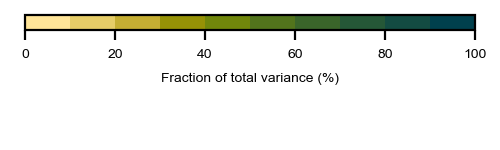
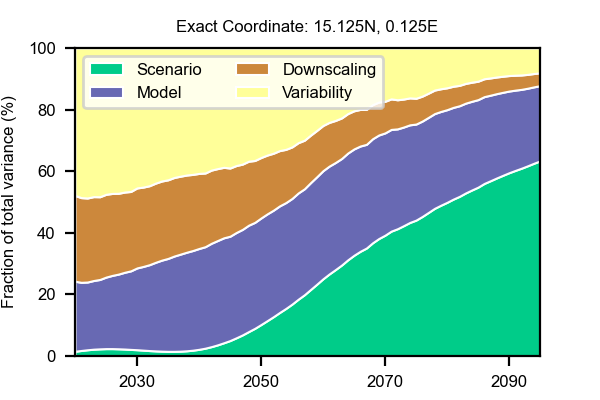

In [24]:
main = pn.Tabs(
    ('Map plots', pn.Column(pn.Row(metric_select_map, time_select, align='center'),
          pn.Row(get_plot_interactive_scenario, get_plot_interactive_model),
          pn.Row(get_plot_interactive_ensemble, get_plot_interactive_iav),
          pn.pane.PNG('./utils/colorbar.png', align='center'))
    ),
    ('Timeseries plots', pn.Column(
    pn.Row(pn.Column(pn.pane.Markdown('### Metric:'), metric_select_gridpoint, align='start'),
           pn.Column(pn.pane.Markdown('### Area of Interest:', height=30), location_type_select, interactive_select_area, align='start')),
    pn.Row(plot_variance_decomposition_interactive, align='center')
))).servable()

pn.Row(sidebar, main)